In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import os
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Importar las clases y funciones personalizadas
from ROUTINES.data_preprocessing.tng50_data_processor import TNG50DataProcessor
from ROUTINES.data_preprocessing.rotation_handler import RotationHandler
from ROUTINES.data_preprocessing.velocity_escape_calculator import VelocityEscapeCalculator
from ROUTINES.filtering.filtering import create_velocity_grid, filter_data_by_velocity, apply_convex_hull_filter
from ROUTINES.visualization.visualization_handler import visualize_convex_hull
from ROUTINES.filtering.density_based_spatial_clustering import apply_dbscan_filter, Points_no_outliers

# Directorio y archivos a procesar
data_dir = 'DATA/raw'
data_dir_processed = 'DATA/processed'


In [2]:
def plot_orthogonal_projections(df_filtered, title_prefix="Proyección Ortogonal"):
    """
    Función para graficar las proyecciones ortogonales de los datos filtrados en los planos XY, XZ, YZ.
    
    :param df_filtered: DataFrame con los datos filtrados que contienen las columnas 'x', 'y', 'z'.
    :param title_prefix: Título a usar como prefijo en los gráficos.
    """
    
    # Crear figura para las tres proyecciones ortogonales
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Determinar los límites para asegurar que los tres gráficos tengan la misma escala
    x_limits = [df_filtered['x'].min(), df_filtered['x'].max()]
    y_limits = [df_filtered['y'].min(), df_filtered['y'].max()]
    z_limits = [df_filtered['z'].min(), df_filtered['z'].max()]

    # Definir los límites comunes
    common_limits = [-20,20 ]

    # Proyección en el plano XY
    axs[0].scatter(df_filtered['x'], df_filtered['y'], s=0.01, color='blue')
    axs[0].set_title(f'{title_prefix} XY')
    axs[0].set_xlabel('X')
    axs[0].set_ylabel('Y')
    axs[0].axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    axs[0].axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    axs[0].set_xlim(common_limits)
    axs[0].set_ylim(common_limits)
    axs[0].set_aspect('equal')

    # Proyección en el plano XZ
    axs[1].scatter(df_filtered['x'], df_filtered['z'], s=0.01, color='green')
    axs[1].set_title(f'{title_prefix} XZ')
    axs[1].set_xlabel('X')
    axs[1].set_ylabel('Z')
    axs[1].axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    axs[1].axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    axs[1].set_xlim(common_limits)
    axs[1].set_ylim(common_limits)
    axs[1].set_aspect('equal')

    # Proyección en el plano YZ
    axs[2].scatter(df_filtered['y'], df_filtered['z'], s=0.01, color='red')
    axs[2].set_title(f'{title_prefix} YZ')
    axs[2].set_xlabel('Y')
    axs[2].set_ylabel('Z')
    axs[2].axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    axs[2].axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    axs[2].set_xlim(common_limits)
    axs[2].set_ylim(common_limits)
    axs[2].set_aspect('equal')

    # Ajustar la disposición de la figura
    plt.tight_layout()
    plt.show()


In [3]:

# Nombre de los archivos
halo_files = ['dhc_halo_11.gas', 'dhc_halo_17.gas', 'dhc_halo_117256.gas', 'dhc_halo_198185.gas', 'dhc_halo_418336.gas']

# Cargar cada archivo en un DataFrame de Pandas
archivos_dataframes = []
for archivo in halo_files:
    # Construir la ruta completa al archivo
    ruta_completa = os.path.join(data_dir, archivo)
    
    # Leer el archivo en un DataFrame
    df = pd.read_csv(ruta_completa, sep=' ', names=['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho'], header=None)
    archivos_dataframes.append(df)

# Mostrar la lista de DataFrames para verificar la carga
for i, df in enumerate(archivos_dataframes):
    print(f"Archivo {halo_files[i]} cargado con {len(df)} filas.")


Archivo dhc_halo_11.gas cargado con 102609 filas.
Archivo dhc_halo_17.gas cargado con 83980 filas.
Archivo dhc_halo_117256.gas cargado con 238336 filas.
Archivo dhc_halo_198185.gas cargado con 66875 filas.
Archivo dhc_halo_418336.gas cargado con 43912 filas.


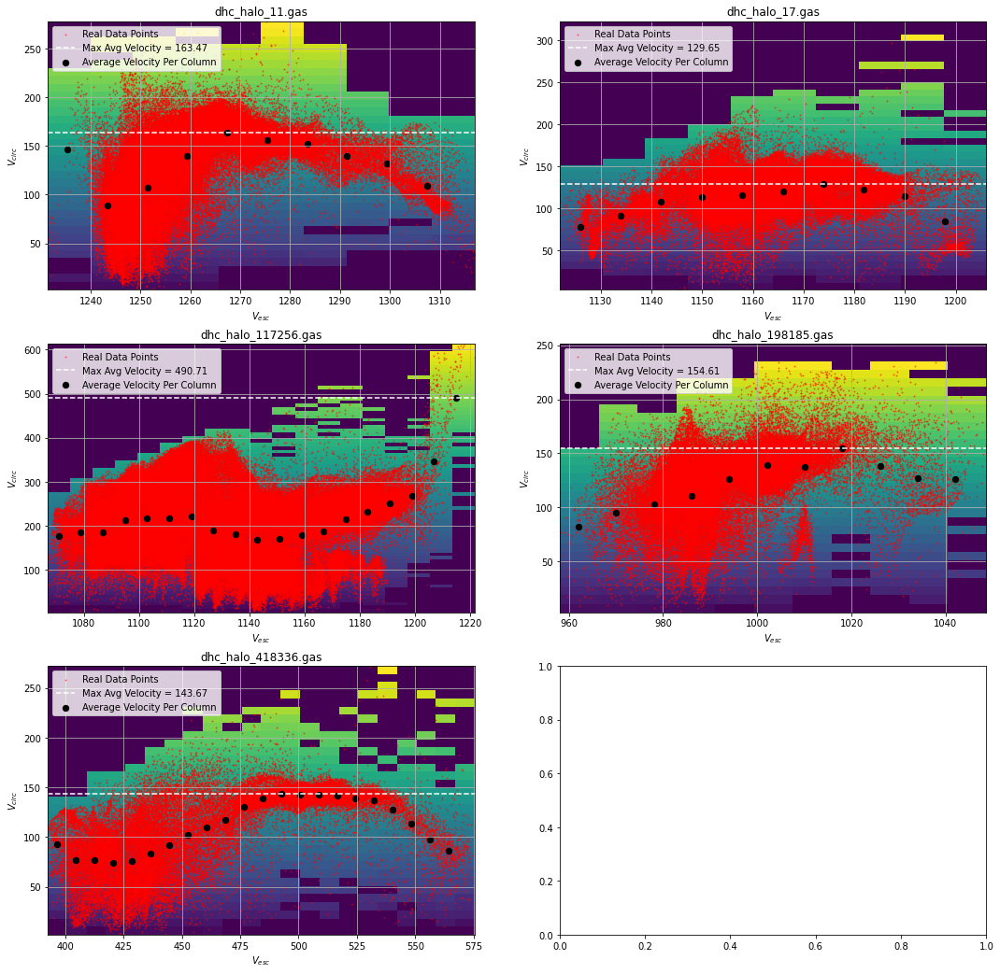

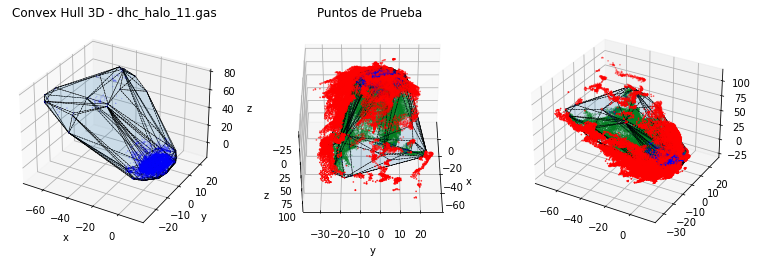

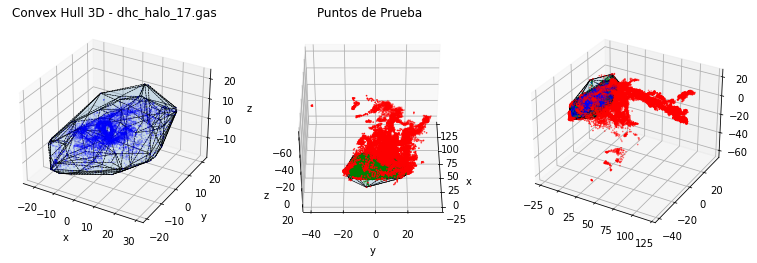

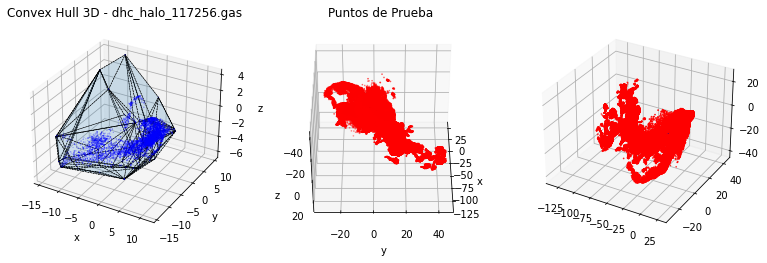

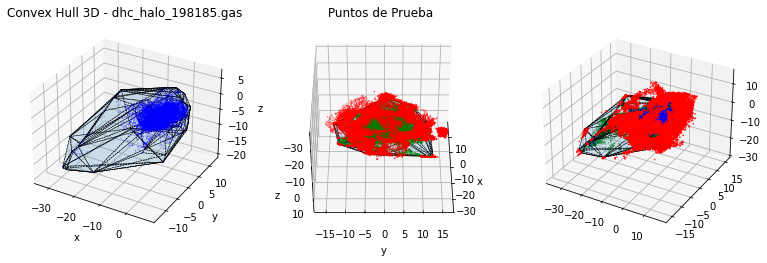

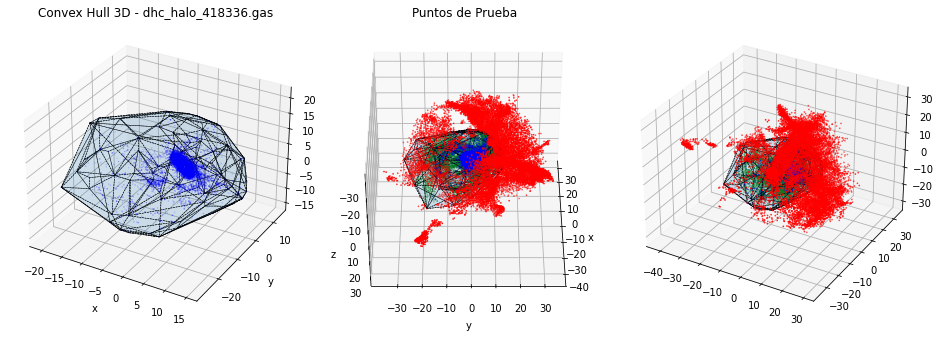

In [3]:
# Crear figuras para graficar los resultados
fig, axs = plt.subplots(3, 2, figsize=(18, 18))
axs = axs.flatten()

# Iterar sobre los archivos de halo
for idx, file_name in enumerate(halo_files):
    file_path = f'{data_dir}/{file_name}'
    
    # Cargar y procesar los datos usando TNG50DataProcessor
    simulation = TNG50DataProcessor(file_path)
    
    # Calcular el centro de masa y el momento angular total
    center_of_mass = simulation.calculate_center_of_mass_new(2.63)
    total_angular_momentum = simulation.calculate_total_angular_momentum()
    
    # **Alinear el momento angular con el eje Z**
    rotation_matrix = simulation.align_with_z_axis(total_angular_momentum)
    
    # Aplicar rotación a las posiciones y velocidades usando la nueva matriz de rotación
    rotated_vectors_position = simulation.apply_rotation(rotation_matrix, simulation.accumulated_data[:, :3])
    rotated_vectors_velocity = simulation.apply_rotation(rotation_matrix, simulation.accumulated_data[:, 3:6])
    
    # Concatenar los datos rotados y otros datos relevantes (e.g., energía, potencial)
    rotated_data = np.concatenate([rotated_vectors_position, rotated_vectors_velocity, simulation.accumulated_data[:, 6:]], axis=1)
    potential = simulation.accumulated_data[:, 9]

    # Calcular magnitudes y velocidades de escape
    calculator = VelocityEscapeCalculator(rotated_data, potential)
    calculator.calculate_magnitudes()
    calculator.calculate_escape_velocity()
    processed_data = calculator.get_processed_data()

    # Crear el grid de velocidades
    grid_data, v_esc_midpoints, weighted_avg_velocity_per_column, max_avg_velocity, v_circ_min, v_circ_max, v_esc_min, v_esc_max = create_velocity_grid(processed_data)

    # Filtrar los datos por velocidad promedio
    filtered_data = filter_data_by_velocity(processed_data, max_avg_velocity, v_esc_midpoints, weighted_avg_velocity_per_column)

    # Aplicar Convex Hull a las posiciones rotadas
    hull_3d, points_3d_datos, esta_dentro_hull, max_distance, sample_points = apply_convex_hull_filter(rotated_vectors_position, filtered_data, rotated_data, idx)

    # Visualizar resultados en la subfigura correspondiente
    ax = axs[idx]
    ax.imshow(grid_data, origin='lower', aspect='auto', extent=[v_esc_min, v_esc_max, v_circ_min, v_circ_max], cmap='viridis')
    ax.scatter(processed_data['escape_velocity'], processed_data['velocity_magnitude'], color='red', s=1, alpha=0.45, label='Real Data Points')
    ax.axhline(y=max_avg_velocity, color='white', linestyle='--', label=f'Max Avg Velocity = {max_avg_velocity:.2f}')
    ax.scatter(v_esc_midpoints, weighted_avg_velocity_per_column, color='black', s=40, label='Average Velocity Per Column')
    ax.set_title(f'{file_name}')
    ax.set_xlabel(r'$V_{esc}$')
    ax.set_ylabel(r'$V_{circ}$')
    ax.legend(loc=2)
    ax.grid(True)
    
    # Mostrar la gráfica del Convex Hull
    visualize_convex_hull(hull_3d, sample_points, points_3d_datos, esta_dentro_hull, file_name)

# Ajustar el diseño de las subfiguras
plt.tight_layout()
plt.show()



In [29]:

# Nombre de los archivos
halo_files = ['halo_0_datos_dentro_hull.csv', 'halo_1_datos_dentro_hull.csv', 'halo_2_datos_dentro_hull.csv', 'halo_3_datos_dentro_hull.csv', 'halo_4_datos_dentro_hull.csv']

# Cargar cada archivo en un DataFrame de Pandas
archivos_dataframes_hull = []
for archivo in halo_files:
    # Construir la ruta completa al archivo
    ruta_completa = os.path.join(data_dir_processed, archivo)
    
    # Leer el archivo en un DataFrame
    df = pd.read_csv(ruta_completa, sep=',', names=['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho'], header=0)
    archivos_dataframes_hull.append(df)

# Mostrar la lista de DataFrames para verificar la carga
for i, df in enumerate(archivos_dataframes_hull):
    print(f"Archivo {halo_files[i]} cargado con {len(df)} filas.")

Archivo halo_0_datos_dentro_hull.csv cargado con 88643 filas.
Archivo halo_1_datos_dentro_hull.csv cargado con 72659 filas.
Archivo halo_2_datos_dentro_hull.csv cargado con 58331 filas.
Archivo halo_3_datos_dentro_hull.csv cargado con 53755 filas.
Archivo halo_4_datos_dentro_hull.csv cargado con 30387 filas.


In [30]:
archivos_dataframes_hull[0]

,x,y,z,vx,vy,vz,lxvel,lyvel,lzvel,Potential,U,rho
0,-0.015567,-0.011434,-0.054515,2.269935,-27.754485,21.072559,29.390442,-10.811890,19.039185,-866740.1875,681.728210,0.006075
1,-0.052491,-0.021354,-0.013716,25.199726,-29.595043,4.716941,26.918701,-23.082489,-6.258881,-867144.6250,842.386108,0.009121
2,0.004087,0.167887,-0.028949,-14.368319,9.487614,-12.325093,-14.943665,15.058105,7.020905,-866194.8125,805.895386,0.008356
3,0.088743,0.041608,-0.075495,3.424207,25.149270,-3.498220,-2.205566,28.644379,-10.094269,-866091.1875,654.943665,0.005644
4,-0.086220,0.070761,-0.006969,5.420287,-41.769093,9.140215,23.746338,-28.437561,16.550293,-866697.0625,696.260498,0.006318
5,-0.084372,-0.007840,0.029790,30.095479,-26.969584,-10.042166,16.169434,-26.880981,-17.154633,-866746.7500,975.596008,0.012317
6,0.048775,-0.055646,-0.038125,40.165232,31.678173,-4.399763,13.330322,26.466309,-43.965118,-866826.2500,750.559875,0.007280
7,0.049365,0.042864,0.033076,10.005481,53.266481,-22.164905,-20.892090,46.386459,-32.861969,-866891.3125,668.871155,0.005866
8,0.003265,-0.101846,-0.076134,33.143974,1.601817,28.069092,43.956329,11.848175,-14.699615,-865730.4375,715.207581,0.006644
9,-0.093771,0.151565,0.033384,1.861157,-16.911442,-28.830087,-15.540771,-18.250061,-4.066498,-865600.5000,900.740417,0.010441


In [31]:
df_halo_11 = archivos_dataframes_hull[0]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_11)

In [32]:
print(f'eps:{eps}, min_samples: {min_samples}, labels:{labels}')

eps:0.2, min_samples: 20, labels:[ 0  0  0 ... -1 -1  0]


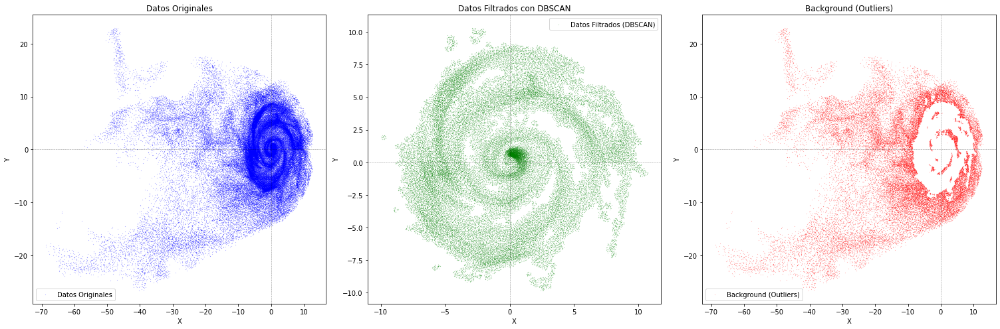

In [33]:
# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_11['x'], df_halo_11['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()


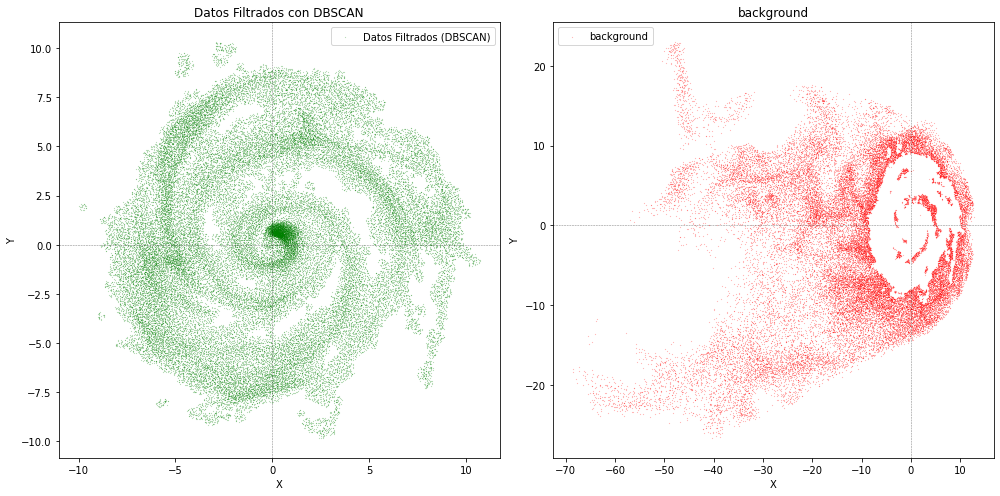

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 2)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='background')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('background')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Gráfico de los datos filtrados con DBSCAN
plt.subplot(1, 2, 1)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

plt.tight_layout()
plt.show()

In [35]:
def plot_dbscan_results(df, df_filtered, Background_df, eps, min_samples):
    plt.figure(figsize=(15, 5))
    
    # Gráfico de los datos originales
    plt.subplot(1, 3, 1)
    plt.scatter(df['x'], df['y'], s=0.01, c='blue', label='Datos Originales')
    plt.title(f'Datos Originales')
    
    # Gráfico de los datos filtrados con DBSCAN
    plt.subplot(1, 3, 2)
    plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Filtrados (DBSCAN)')
    plt.title(f'Datos Filtrados (DBSCAN) - eps={eps}, min_samples={min_samples}')
    
    # Gráfico del background (outliers)
    plt.subplot(1, 3, 3)
    plt.scatter(Background_df['x'], Background_df['y'], s=0.01, c='red', label='Background (Outliers)')
    plt.title(f'Outliers (Background) - eps={eps}, min_samples={min_samples}')
    
    plt.tight_layout()
    plt.show()

### Variación sistemática

### DBSCAN

class sklearn.cluster.DBSCAN(eps=0.5, *, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)

#### Parameters:

- **eps**: *float*, default=0.5  
  The maximum distance between two samples for one to be considered as in the neighborhood of the other. This is not a maximum bound on the distances of points within a cluster. This is the most important DBSCAN parameter to choose appropriately for your data set and distance function.

- **min_samples**: *int*, default=5  
  The number of samples (or total weight) in a neighborhood for a point to be considered as a core point. This includes the point itself. If `min_samples` is set to a higher value, DBSCAN will find denser clusters, whereas if it is set to a lower value, the found clusters will be more sparse.
  
...{...}


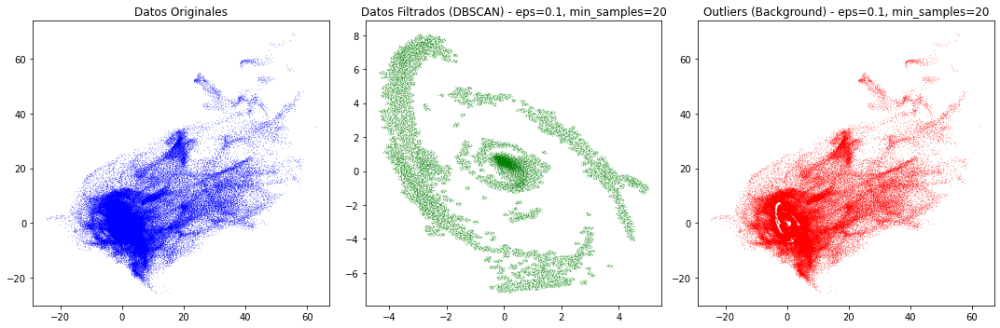

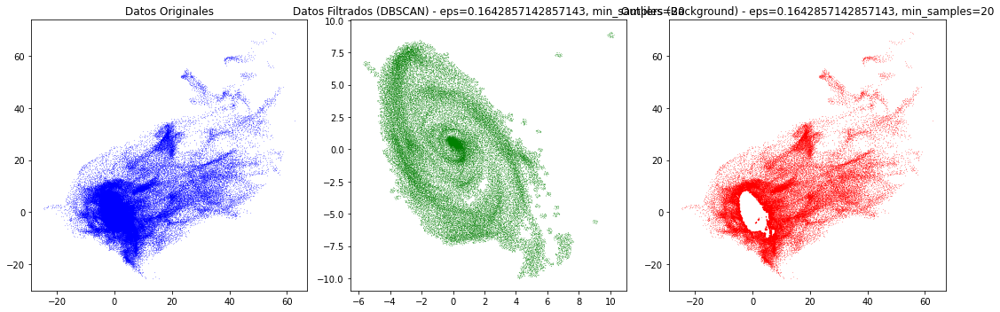

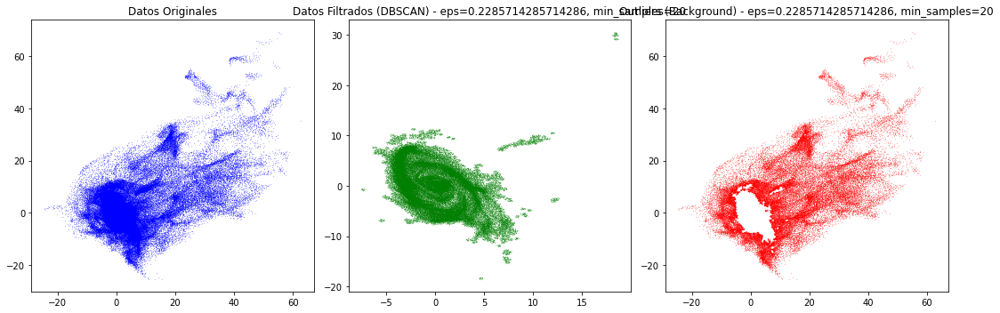

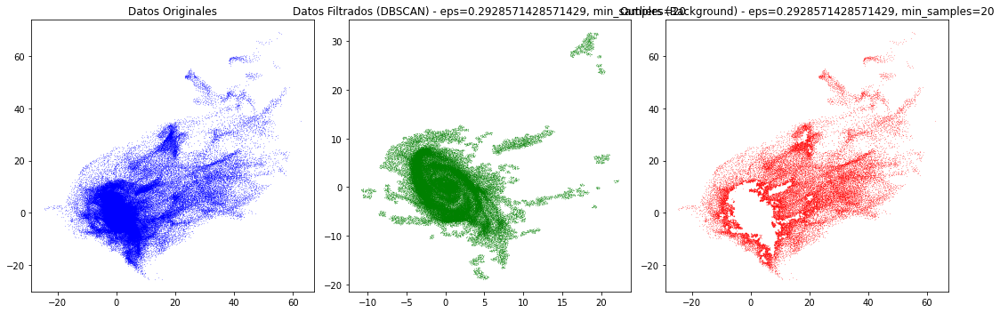

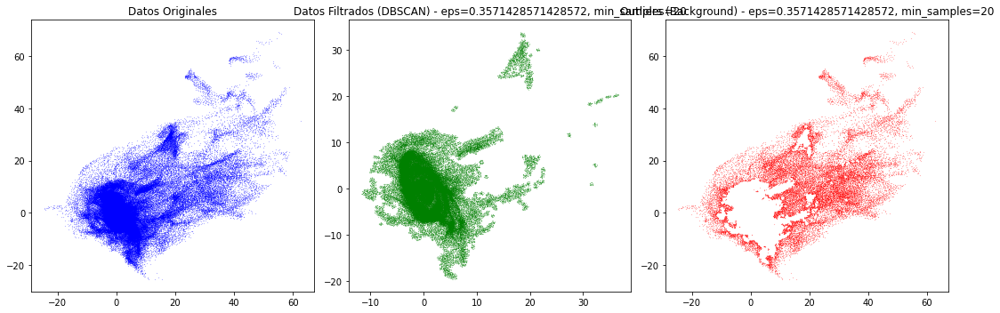

...

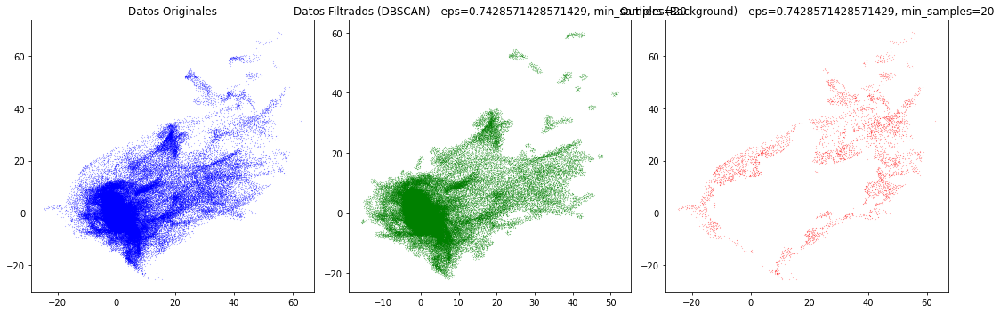

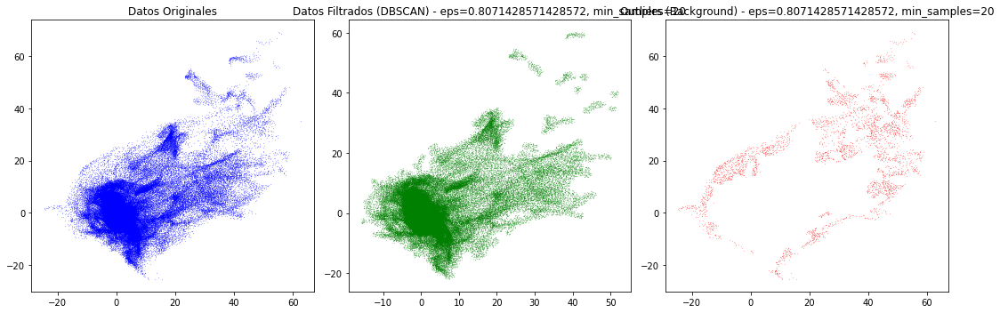

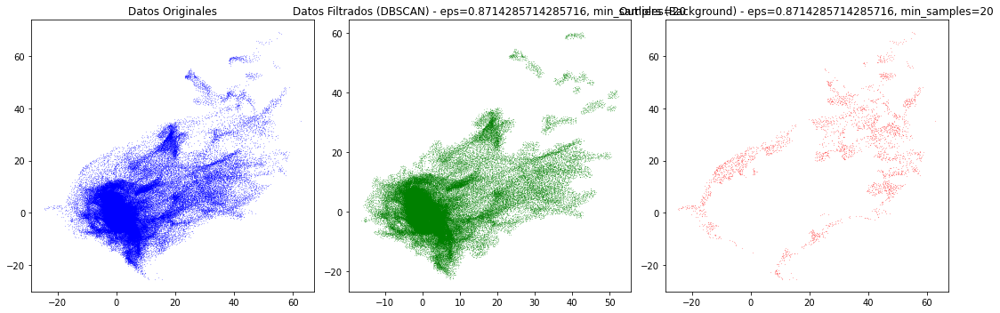

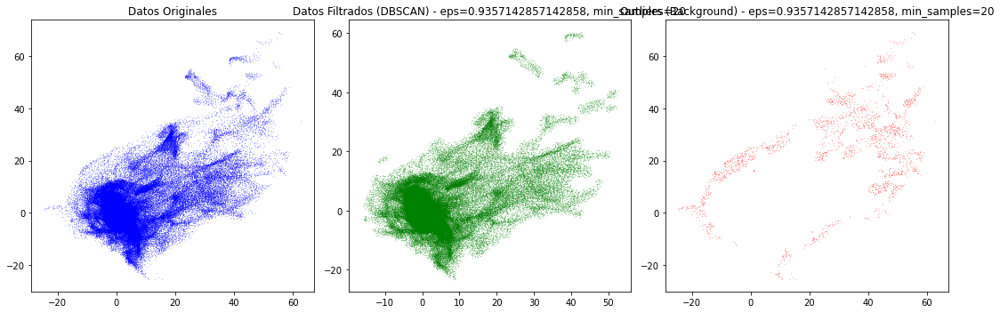

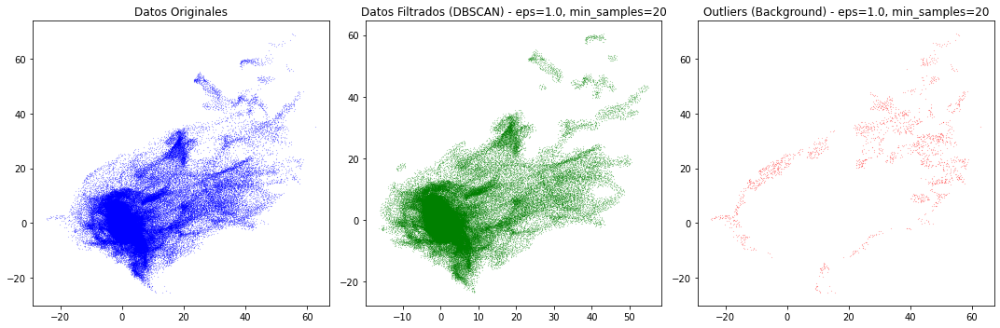

In [8]:
# variación sistemática de eps, fijando min_samples

eps_values = np.linspace(0.1, 1.0, 15)  
min_samples_fixed = 20  # Valor fijo 

# Aplicar DBSCAN con diferentes valores de eps
for eps in eps_values:
    df_filtered, background, eps_used, min_samples_used, labels = apply_dbscan_filter(df_halo_11, eps=eps, min_samples=min_samples_fixed)
    plot_dbscan_results(df_halo_11, df_filtered, background, eps, min_samples_fixed)


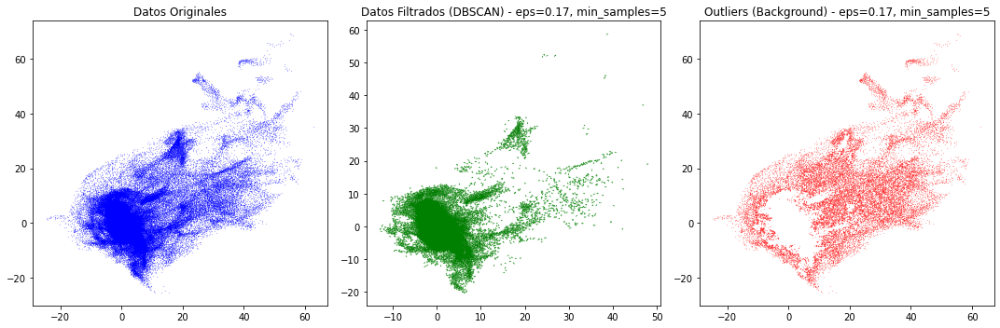

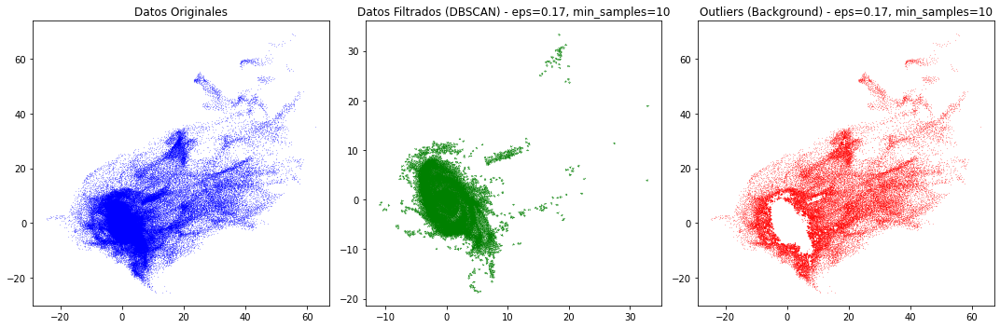

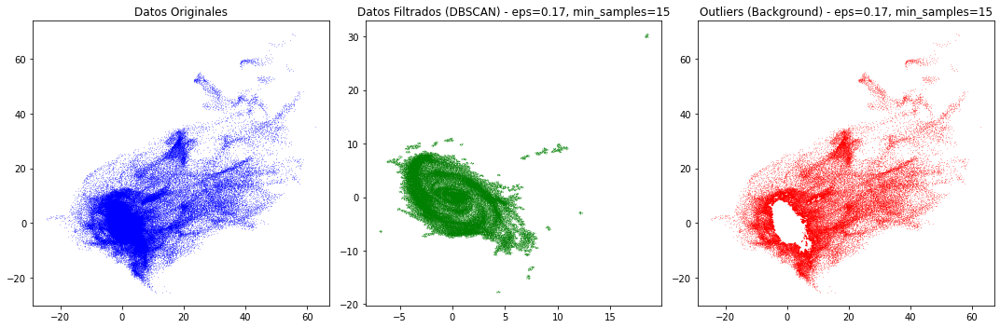

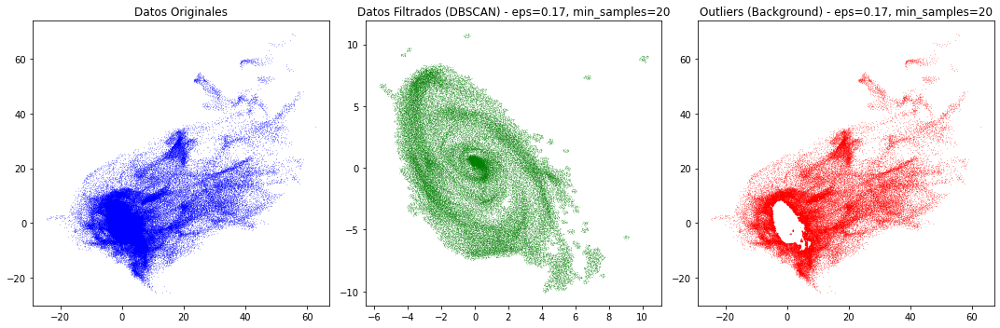

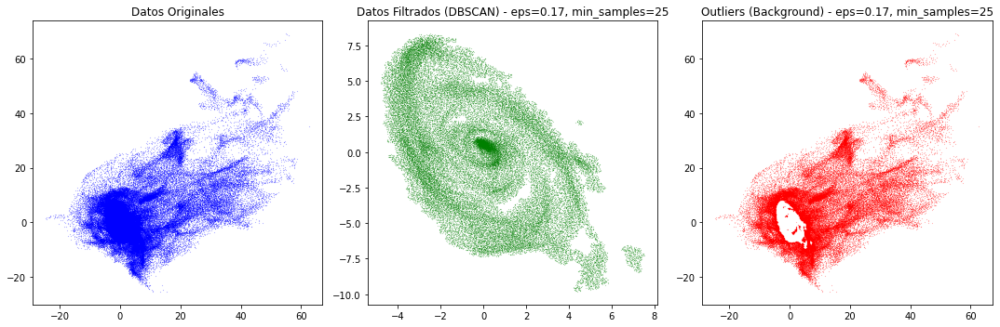

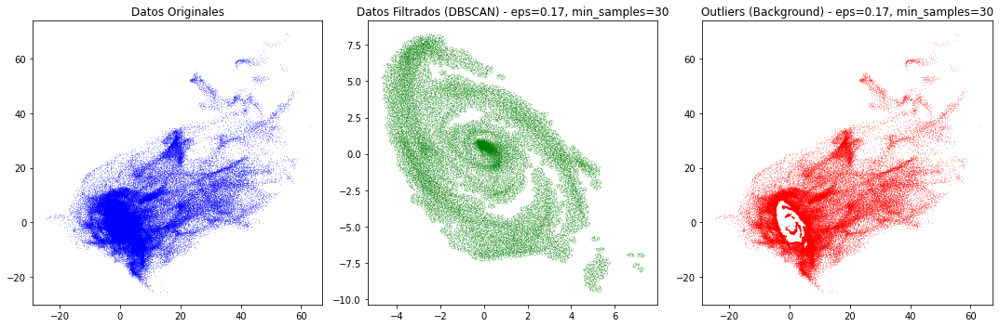

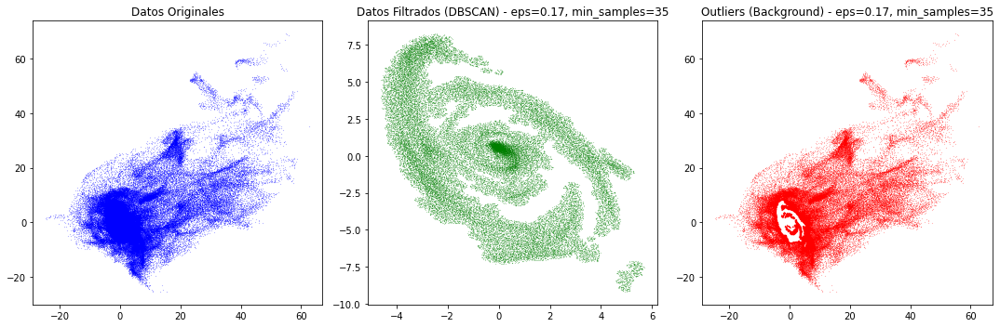

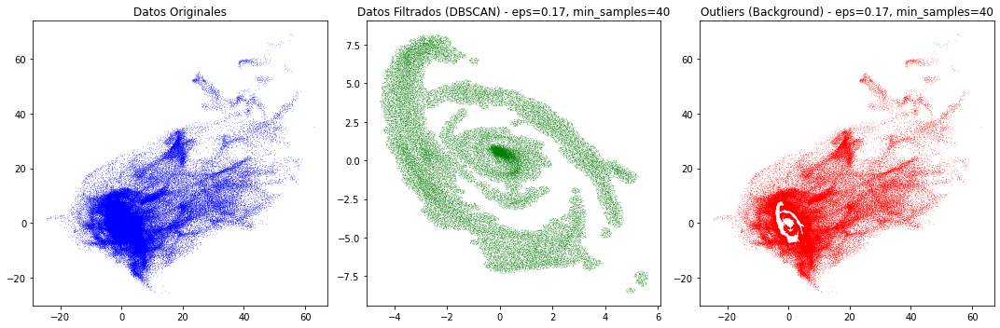

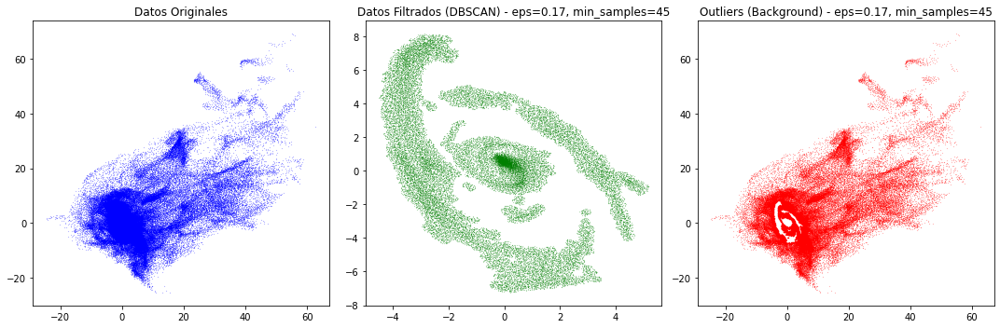

In [8]:
# Fijar eps y variar min_samples
eps_fixed = 0.17  # Fijar el valor de eps
min_samples_values = range(5, 50, 5)  # Variar


for min_samples in min_samples_values:
    df_filtered, background, eps_used, min_samples_used, labels = apply_dbscan_filter(df_halo_11, eps=eps_fixed, min_samples=min_samples)
    plot_dbscan_results(df_halo_11, df_filtered, background, eps_fixed, min_samples)

    

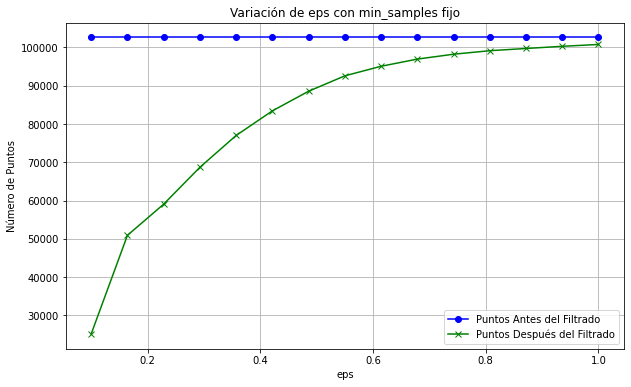

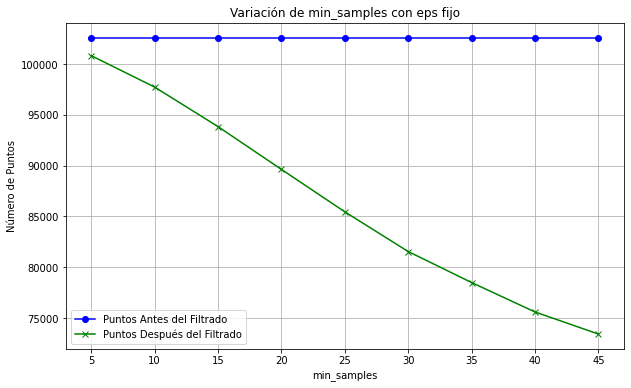

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Listas para almacenar 
results_eps = []
results_min_samples = []

# Variación eps, fijando min_samples
eps_values = np.linspace(0.1, 1.0, 15)
min_samples_fixed = 20  # Valor fijo

# Aplicar DBSCAN con diferentes valores de eps
for eps in eps_values:
    df_filtered, background, eps_used, min_samples_used, labels = apply_dbscan_filter(df_halo_11, eps=eps, min_samples=min_samples_fixed)
    
    # Puntos antes y después del filtrado
    total_points_before = len(df_halo_11)
    total_points_after = len(df_filtered)
    
    # Almacenar
    results_eps.append({
        'eps': eps_used,
        'min_samples': min_samples_used,
        'points_before': total_points_before,
        'points_after': total_points_after
    })
    

# Fijar eps y variar min_samples
eps_fixed = 0.5  # Fijar el valor de eps
min_samples_values = range(5, 50, 5)  # Variar min_samples

# Aplicar DBSCAN con diferentes valores de min_samples
for min_samples in min_samples_values:
    df_filtered, background, eps_used, min_samples_used, labels = apply_dbscan_filter(df_halo_11, eps=eps_fixed, min_samples=min_samples)
    
    total_points_before = len(df_halo_11)
    total_points_after = len(df_filtered)
    
    results_min_samples.append({
        'eps': eps_fixed,
        'min_samples': min_samples_used,
        'points_before': total_points_before,
        'points_after': total_points_after
    })

# Convertir a DataFrames
df_eps_results = pd.DataFrame(results_eps)
df_min_samples_results = pd.DataFrame(results_min_samples)


# Graficar 
plt.figure(figsize=(10, 6))
plt.plot(df_eps_results['eps'], df_eps_results['points_before'], label='Puntos Antes del Filtrado', color='blue', marker='o')
plt.plot(df_eps_results['eps'], df_eps_results['points_after'], label='Puntos Después del Filtrado', color='green', marker='x')
plt.xlabel('eps')
plt.ylabel('Número de Puntos')
plt.title('Variación de eps con min_samples fijo')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(df_min_samples_results['min_samples'], df_min_samples_results['points_before'], label='Puntos Antes del Filtrado', color='blue', marker='o')
plt.plot(df_min_samples_results['min_samples'], df_min_samples_results['points_after'], label='Puntos Después del Filtrado', color='green', marker='x')
plt.xlabel('min_samples')
plt.ylabel('Número de Puntos')
plt.title('Variación de min_samples con eps fijo')
plt.legend()
plt.grid(True)
plt.show()



In [11]:
# Mostrar los DataFrames para verificar
print("Resultados de variación de eps:")
df_eps_results


Resultados de variación de eps:


,eps,min_samples,points_after,points_before
0,0.100000,20,25147,102609
1,0.164286,20,50914,102609
2,0.228571,20,59057,102609
3,0.292857,20,68693,102609
4,0.357143,20,77005,102609
5,0.421429,20,83428,102609
6,0.485714,20,88560,102609
7,0.550000,20,92583,102609
8,0.614286,20,95083,102609
9,0.678571,20,96955,102609


In [12]:
print("Resultados de variación de min_samples:")
df_min_samples_results


Resultados de variación de min_samples:


,eps,min_samples,points_after,points_before
0,0.5,5,100830,102609
1,0.5,10,97738,102609
2,0.5,15,93846,102609
3,0.5,20,89633,102609
4,0.5,25,85456,102609
5,0.5,30,81547,102609
6,0.5,35,78495,102609
7,0.5,40,75599,102609
8,0.5,45,73426,102609


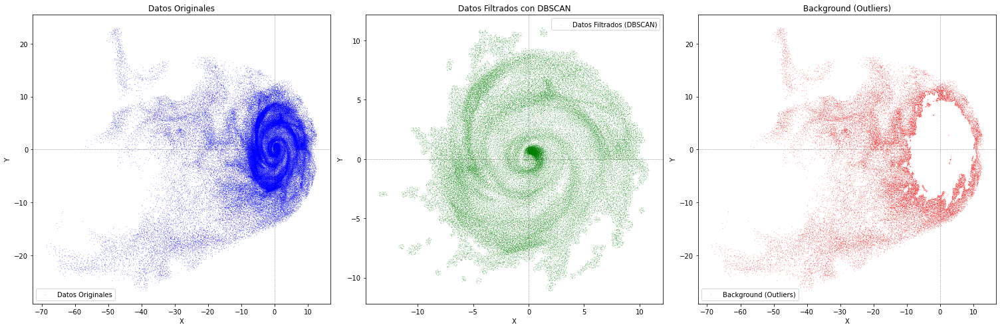

In [46]:
df_halo_11 = archivos_dataframes_hull[0]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_11, eps =0.24, min_samples=20)

# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_11['x'], df_halo_11['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()

In [49]:
total_points_origin = len(df_halo_11)
total_points_dbscan = len(df_filtered)
total_points_background = len(background)
print(total_points_origin, total_points_dbscan, total_points_background)

88643 59558 29085


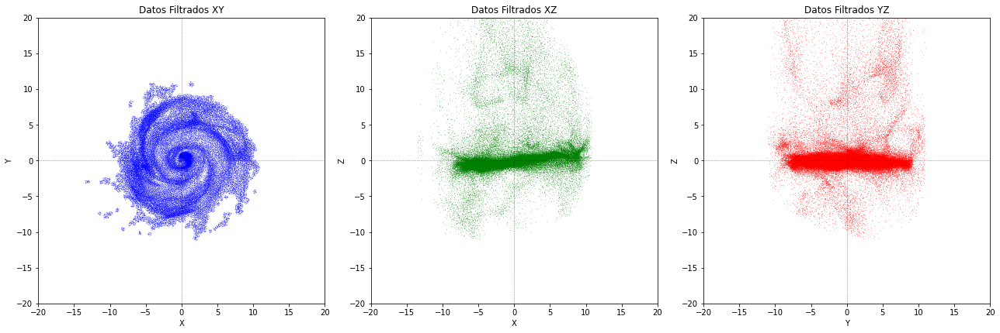

In [50]:
plot_orthogonal_projections(df_filtered, title_prefix="Datos Filtrados")


# mal orientados ---- corregir

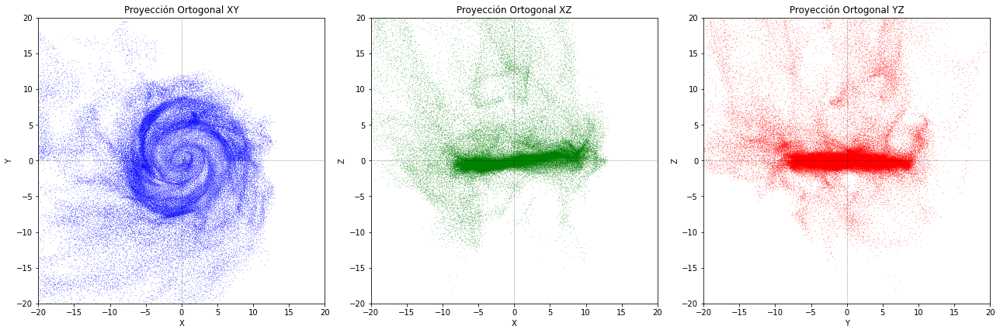

In [21]:
 
simulation = TNG50DataProcessor(data = df_halo_11)  # df_filtered es el DataFrame ya filtrado
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()
# Aplicar rotación a las posiciones y velocidades usando la nueva matriz de rotación
rotated_vectors_position = simulation.accumulated_data[:, :3]
rotated_vectors_velocity = simulation.accumulated_data[:, 3:6]

# Concatenar los datos rotados y otros datos relevantes (e.g., energía, potencial)
    rotated_data = np.concatenate([rotated_vectors_position, rotated_vectors_velocity, simulation.accumulated_data[:, 6:]], axis=1)
# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)


#hull_3d, points_3d_datos, esta_dentro_hull, max_distance, sample_points = apply_convex_hull_filter(df_halo_11, df_filtered, rotated_data, idx)

    # Visualizar resultados en la subfigura correspondiente

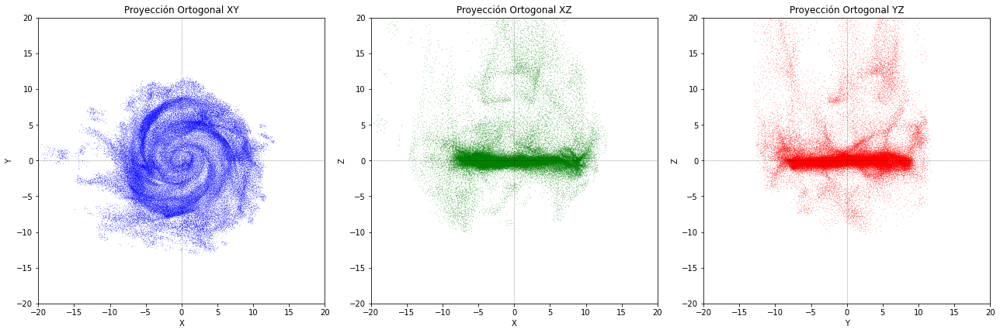

In [42]:
 
simulation = TNG50DataProcessor(data = df_filtered)  # df_filtered es el DataFrame ya filtrado
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()

# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)



In [43]:
idx='11'
column_names = ['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho']
df_dbscan_data = pd.DataFrame(rotated_data_total, columns=column_names)

# Guardar como CSV para preservar la estructura y facilitar la lectura posterior
df_dbscan_data.to_csv(f'DATA/processed/halo_{idx}_datos_dbscan_final.csv', index=False)

## halo_11

In [ ]:
df_halo_418336 = archivos_dataframes[0]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_418336, eps =0.17, min_samples=20)

# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_418336['x'], df_halo_418336['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()

In [ ]:
total_points_origin = len(df_halo_418336)
total_points_dbscan = len(df_filtered)
total_points_background = len(background)
print(total_points_origin, total_points_dbscan, total_points_background)

In [ ]:
plot_orthogonal_projections(df_filtered, title_prefix="Datos Filtrados")

In [ ]:
## corrección 
simulation = TNG50DataProcessor(data = df_filtered)  
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()

# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)

In [ ]:
idx='11'
column_names = ['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho']
df_dbscan_data = pd.DataFrame(rotated_data_total, columns=column_names)

# Guardar como CSV para preservar la estructura y facilitar la lectura posterior
df_dbscan_data.to_csv(f'DATA/processed/halo_{idx}_datos_dbscan_sf.csv', index=False)

## halo_418336

### archivos sin filtrado (v_esc, energia interna)

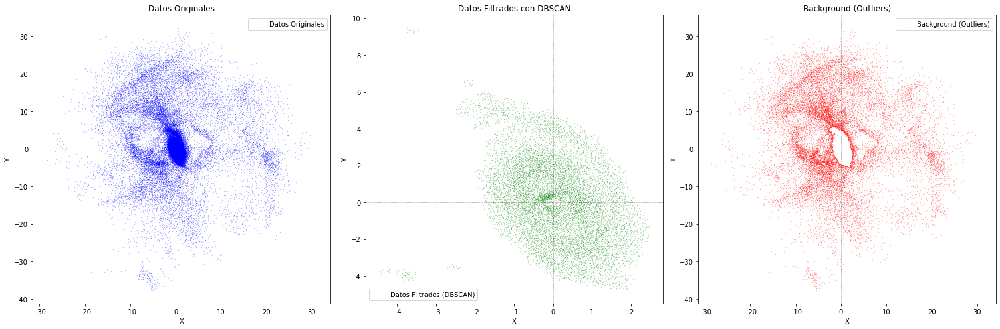

In [52]:
df_halo_418336 = archivos_dataframes[4]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_418336, eps =0.17, min_samples=20)

# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_418336['x'], df_halo_418336['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()

In [53]:
total_points_origin = len(df_halo_418336)
total_points_dbscan = len(df_filtered)
total_points_background = len(background)
print(total_points_origin, total_points_dbscan, total_points_background)

43912 16931 26981


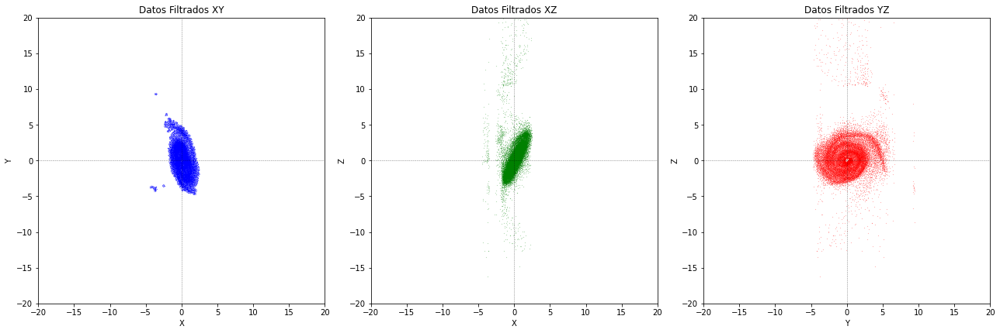

In [54]:
plot_orthogonal_projections(df_filtered, title_prefix="Datos Filtrados")


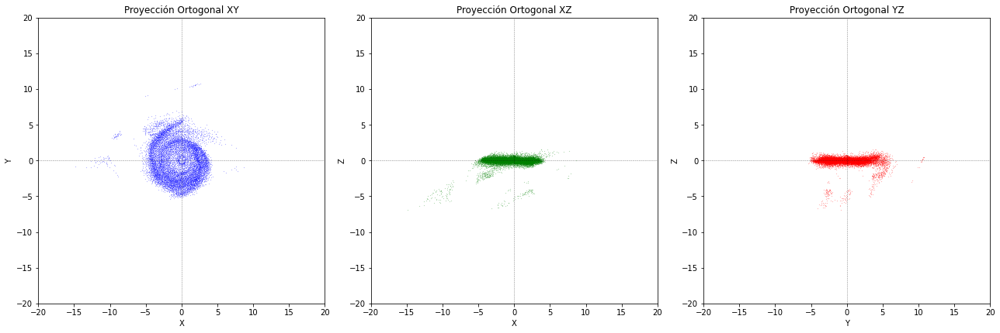

In [56]:
## corrección 
simulation = TNG50DataProcessor(data = df_filtered)  
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()

# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)


In [ ]:
idx='418336'
column_names = ['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho']
df_dbscan_data = pd.DataFrame(rotated_data_total, columns=column_names)

# Guardar como CSV para preservar la estructura y facilitar la lectura posterior
df_dbscan_data.to_csv(f'DATA/processed/halo_{idx}_datos_dbscan_sf.csv', index=False)

### archivos con filtrado (v_esc, energia interna, ConVexHull)


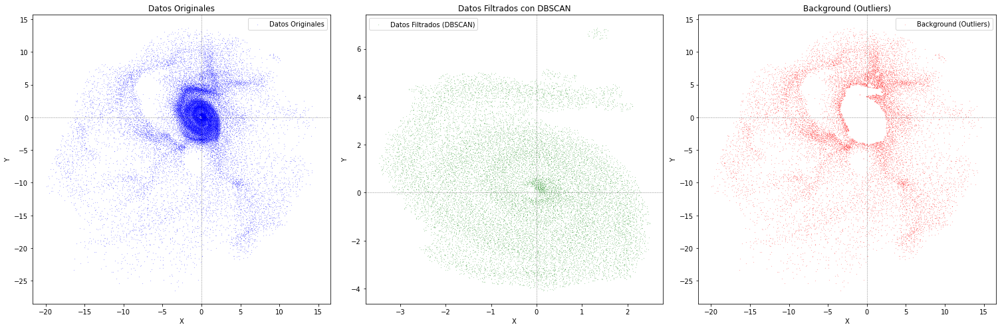

In [57]:
df_halo_418336 = archivos_dataframes_hull[4]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_418336, eps =0.17, min_samples=20)

# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_418336['x'], df_halo_418336['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()

In [58]:
total_points_origin = len(df_halo_418336)
total_points_dbscan = len(df_filtered)
total_points_background = len(background)
print(total_points_origin, total_points_dbscan, total_points_background)

30387 16445 13942


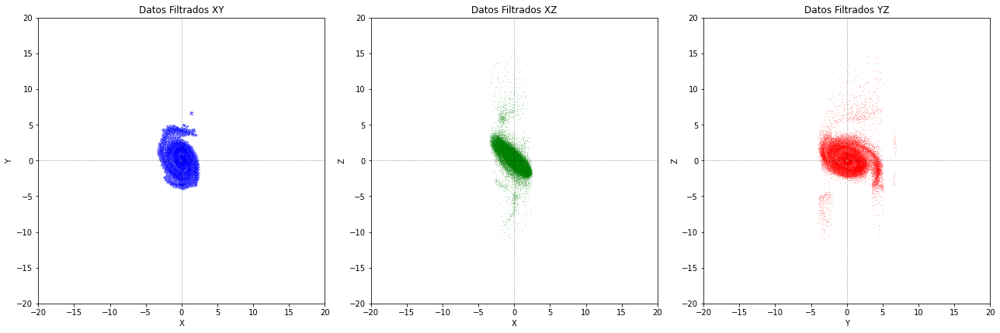

In [59]:
plot_orthogonal_projections(df_filtered, title_prefix="Datos Filtrados")


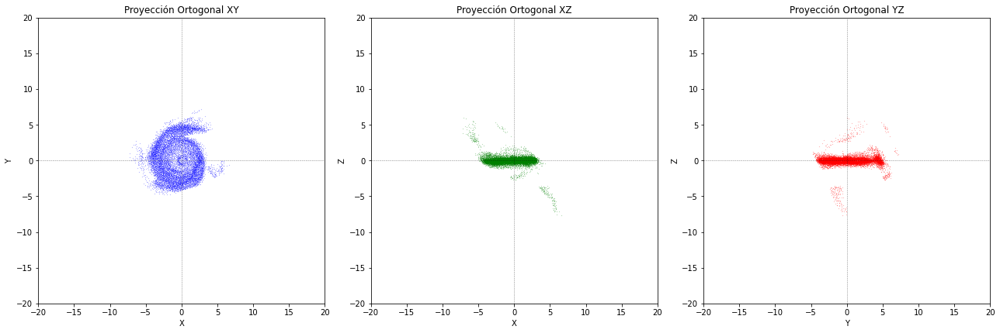

In [60]:
## corrección 
simulation = TNG50DataProcessor(data = df_filtered)  
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()

# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)

## halo_198185

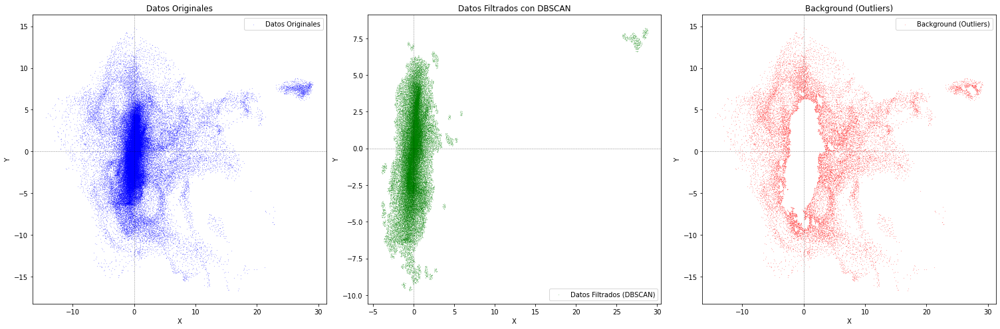

In [61]:
df_halo_198185 = archivos_dataframes[3]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_198185, eps =0.17, min_samples=20)

# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_198185['x'], df_halo_198185['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()

In [62]:
total_points_origin = len(df_halo_198185)
total_points_dbscan = len(df_filtered)
total_points_background = len(background)
print(total_points_origin, total_points_dbscan, total_points_background)

66875 46872 20003


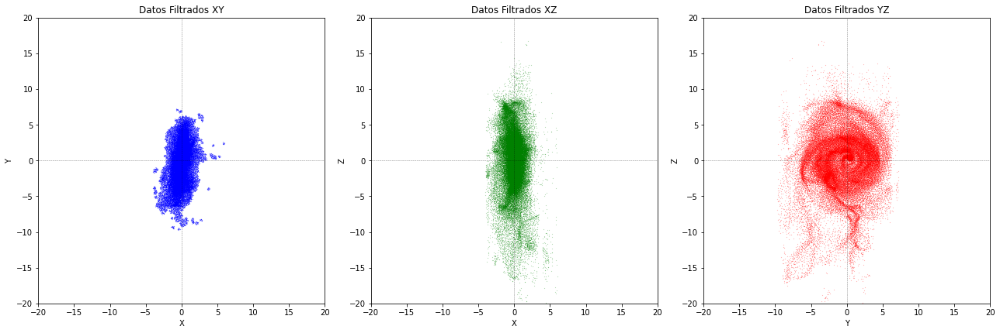

In [63]:
plot_orthogonal_projections(df_filtered, title_prefix="Datos Filtrados")


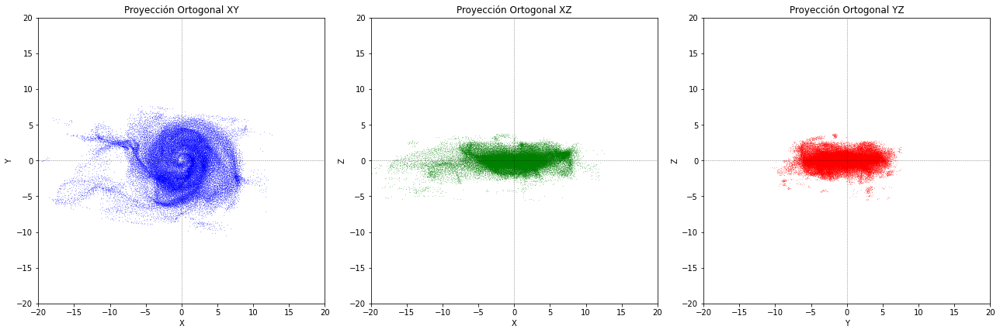

In [65]:
## corrección 
simulation = TNG50DataProcessor(data = df_filtered)  
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()

# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)


In [ ]:
idx='198185'
column_names = ['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho']
df_dbscan_data = pd.DataFrame(rotated_data_total, columns=column_names)

# Guardar como CSV para preservar la estructura y facilitar la lectura posterior
df_dbscan_data.to_csv(f'DATA/processed/halo_{idx}_datos_dbscan_sf.csv', index=False)

## halo_17

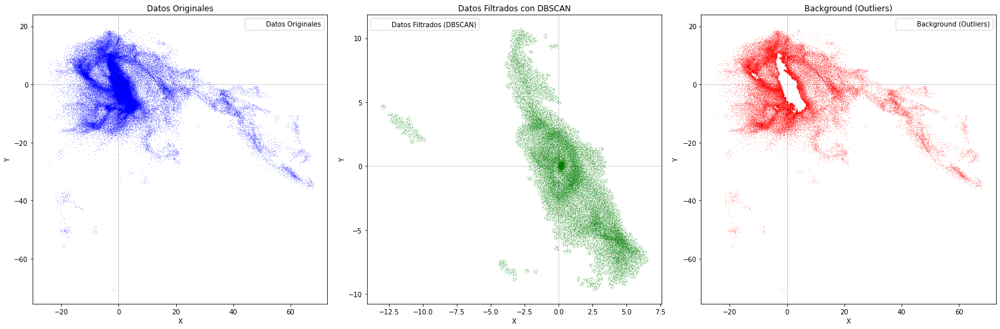

In [66]:
df_halo_17 = archivos_dataframes[1]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_17, eps =0.17, min_samples=20)

# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_17['x'], df_halo_17['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()

In [67]:
total_points_origin = len(df_halo_17)
total_points_dbscan = len(df_filtered)
total_points_background = len(background)
print(total_points_origin, total_points_dbscan, total_points_background)

83980 40920 43060


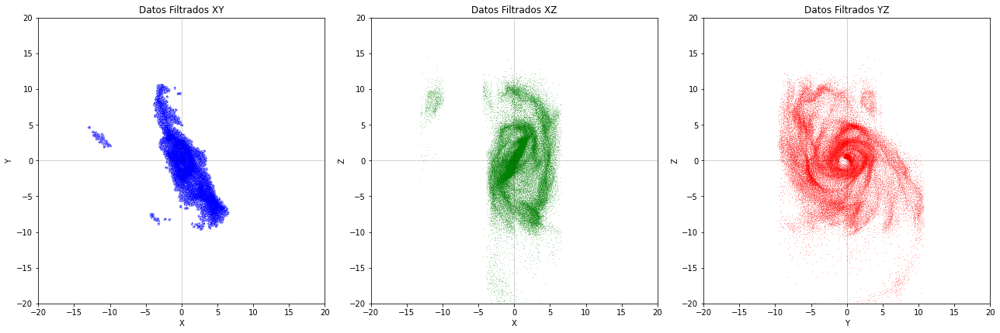

In [68]:
plot_orthogonal_projections(df_filtered, title_prefix="Datos Filtrados")


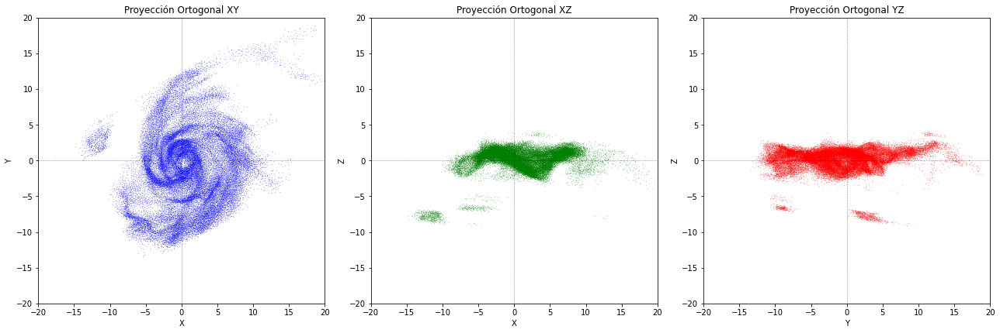

In [69]:
## corrección 
simulation = TNG50DataProcessor(data = df_filtered)  
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()

# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)


In [ ]:
idx='17'
column_names = ['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho']
df_dbscan_data = pd.DataFrame(rotated_data_total, columns=column_names)

# Guardar como CSV para preservar la estructura y facilitar la lectura posterior
df_dbscan_data.to_csv(f'DATA/processed/halo_{idx}_datos_dbscan_sf.csv', index=False)

## halo_117256

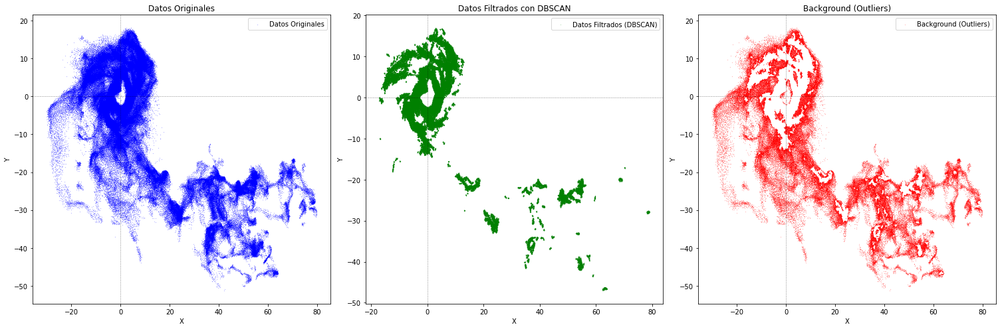

In [71]:
df_halo_117256 = archivos_dataframes[2]
df_filtered, background, eps, min_samples, labels= apply_dbscan_filter(df_halo_17, eps =0.17, min_samples=20)

# Gráfico de los datos originales
plt.figure(figsize=(21, 7))

# Subplot 1: Datos Originales
plt.subplot(1, 3, 1)
plt.scatter(df_halo_117256['x'], df_halo_117256['y'], s=0.01, c='blue', label='Datos Originales')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Originales')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 2: Datos Filtrados con DBSCAN
plt.subplot(1, 3, 2)
plt.scatter(df_filtered['x'], df_filtered['y'], s=0.01, c='green', label='Datos Filtrados (DBSCAN)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Datos Filtrados con DBSCAN')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Subplot 3: Background (Outliers)
plt.subplot(1, 3, 3)
plt.scatter(background['x'], background['y'], s=0.01, c='red', label='Background (Outliers)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Background (Outliers)')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
plt.legend()

# Ajustar la disposición de los subplots
plt.tight_layout()
plt.show()

In [72]:
total_points_origin = len(df_halo_117256)
total_points_dbscan = len(df_filtered)
total_points_background = len(background)
print(total_points_origin, total_points_dbscan, total_points_background)

238336 138745 99591


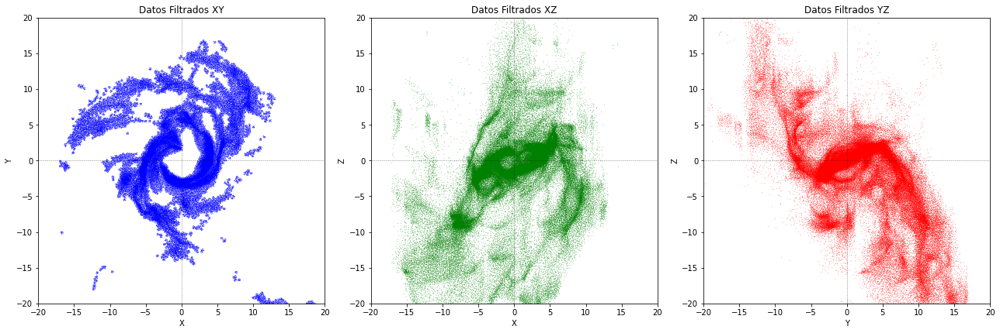

In [73]:
plot_orthogonal_projections(df_filtered, title_prefix="Datos Filtrados")


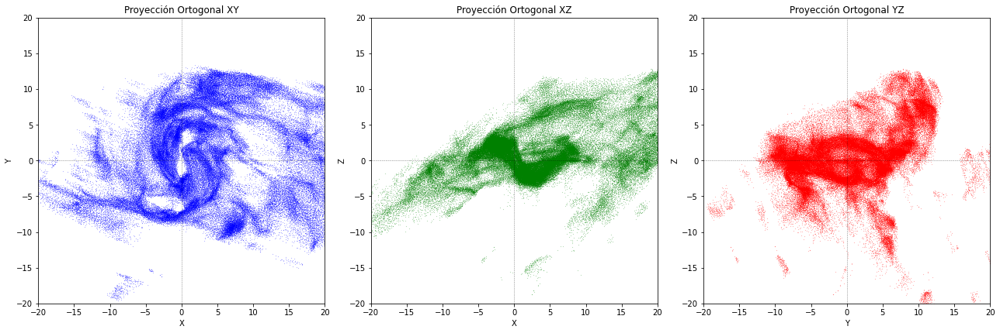

In [74]:
## corrección 
simulation = TNG50DataProcessor(data = df_filtered)  
rotated_data_positions,rotated_data_total = simulation.visualize_rotated_vector()

# Crear un DataFrame de los datos rotados para su uso posterior
rotated_df = pd.DataFrame({
    'x': rotated_data_positions[:, 0],
    'y': rotated_data_positions[:, 1],
    'z': rotated_data_positions[:, 2]
})


plot_orthogonal_projections(rotated_df)

In [75]:
idx='117256'
column_names = ['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho']
df_dbscan_data = pd.DataFrame(rotated_data_total, columns=column_names)

# Guardar como CSV para preservar la estructura y facilitar la lectura posterior
df_dbscan_data.to_csv(f'DATA/processed/halo_{idx}_datos_dbscan_sf.csv', index=False)

In [20]:
'''




def count_clusters(labels):
    return len(set(labels)) - (1 if -1 in labels else 0)

def calculate_outlier_ratio(labels):
    n_outliers = sum(labels == -1)
    return n_outliers / len(labels)

def calculate_silhouette_score(coordinates, labels):
    return silhouette_score(coordinates, labels) if len(set(labels)) > 1 else -1
    
    
'''
